<a href="https://colab.research.google.com/github/Keyur-0157/AI-Ground-water-management/blob/main/Exploratory_analysis_GRAPHS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

In [ ]:
dataset = pd.read_csv('Copy of water_data.csv')
dataset

,Unnamed: 0,sno,district,mandal,village,temp_id,long_gis,lat_gis,gwl,Year,...,SO4,Na,K,Ca,Mg,T.H,SAR,Classification,RSC meq / L,Classification.1
0,0,1,ADILABAD,Adilabad,Adilabad,1001,78.524700,19.668300,16.45,2018,...,129.0,95.00,5.00,48,111.826,579.810855,1.715349,C3S1,-6.796217,P.S.
1,1,2,ADILABAD,Bazarhatnur,Bazarhatnur,1002,78.350833,19.458888,38.60,2018,...,115.0,105.00,19.00,104,87.516,619.851974,1.833654,C3S1,-5.197039,P.S.
2,2,3,ADILABAD,Gudihatnoor,Gudihatnoor,1007,78.512222,19.525555,NaN,2018,...,56.0,55.00,2.00,56,72.930,439.876645,1.140169,C3S1,-2.597533,P.S.
3,3,4,ADILABAD,Jainath,Jainath,1009,78.640000,19.730555,6.20,2018,...,30.0,63.00,2.00,40,19.448,179.967105,2.041814,C2S1,1.000658,P.S.
4,4,5,ADILABAD,Narnoor,Narnoor,1010,78.852654,19.495665,6.15,2018,...,25.0,49.00,7.00,32,24.310,179.958882,1.588114,C2S1,0.800822,P.S.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1084,350,375,YADADRI,S.Narayanpur,S.Narayanpur,1880,78.860010,17.144719,25.90,2020,...,32.0,148.00,2.00,144,102.102,779.827303,2.304277,C3S1,-9.796546,P.S.
1085,351,376,YADADRI,Thurkapally,Gandamalla,1881,78.853831,17.733101,6.73,2020,...,25.0,119.00,5.39,72,58.344,419.901316,2.524908,C3S1,-0.798026,P.S.
1086,352,377,YADADRI,Valigonda,T. somaram,1883,78.952290,17.399953,13.62,2020,...,10.0,43.55,2.77,56,34.034,279.942434,1.131686,C2S1,0.201151,P.S.
1087,353,378,YADADRI,Valigonda,Vemulakonda,1885,79.143433,17.347782,4.07,2020,...,105.0,532.00,7.30,400,77.792,1319.868421,6.366760,C4S2,-19.397368,P.S.


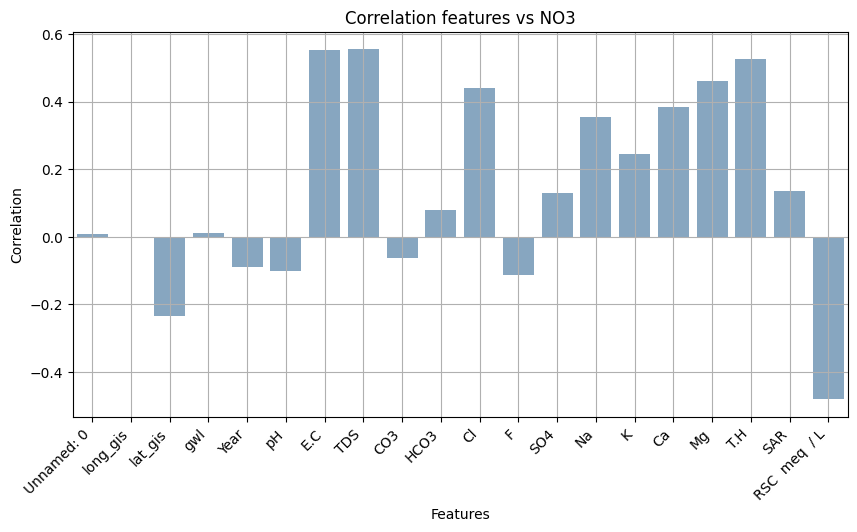

In [ ]:
correlation_values = dataset.select_dtypes(include=np.number).corr()["NO3"].drop(["NO3",'sno','temp_id'])  # Drop self-correlation

# Plot
plt.figure(figsize=(10, 5))
sns.barplot(x=correlation_values.index, y=correlation_values.values, alpha=0.7, color="steelblue")

# Labels and title
plt.xticks(rotation=45, ha="right")
plt.ylabel("Correlation")
plt.xlabel('Features')
plt.title("Correlation features vs NO3")
plt.grid(True)
plt.show()

In [ ]:
from sklearn.impute import KNNImputer

In [ ]:

knn_imputer = KNNImputer(n_neighbors=50)
columns_to_impute = ['gwl']
X = dataset[columns_to_impute]

X_imputed = knn_imputer.fit_transform(X)

dataset[columns_to_impute] = X_imputed

In [ ]:
dataset['Year'] = pd.to_datetime(dataset['Year'],format='%Y')
dataset

,Unnamed: 0,sno,district,mandal,village,temp_id,long_gis,lat_gis,gwl,Year,...,SO4,Na,K,Ca,Mg,T.H,SAR,Classification,RSC meq / L,Classification.1
0,0,1,ADILABAD,Adilabad,Adilabad,1001,78.524700,19.668300,16.450000,2018-01-01,...,129.0,95.00,5.00,48,111.826,579.810855,1.715349,C3S1,-6.796217,P.S.
1,1,2,ADILABAD,Bazarhatnur,Bazarhatnur,1002,78.350833,19.458888,38.600000,2018-01-01,...,115.0,105.00,19.00,104,87.516,619.851974,1.833654,C3S1,-5.197039,P.S.
2,2,3,ADILABAD,Gudihatnoor,Gudihatnoor,1007,78.512222,19.525555,13.617024,2018-01-01,...,56.0,55.00,2.00,56,72.930,439.876645,1.140169,C3S1,-2.597533,P.S.
3,3,4,ADILABAD,Jainath,Jainath,1009,78.640000,19.730555,6.200000,2018-01-01,...,30.0,63.00,2.00,40,19.448,179.967105,2.041814,C2S1,1.000658,P.S.
4,4,5,ADILABAD,Narnoor,Narnoor,1010,78.852654,19.495665,6.150000,2018-01-01,...,25.0,49.00,7.00,32,24.310,179.958882,1.588114,C2S1,0.800822,P.S.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1084,350,375,YADADRI,S.Narayanpur,S.Narayanpur,1880,78.860010,17.144719,25.900000,2020-01-01,...,32.0,148.00,2.00,144,102.102,779.827303,2.304277,C3S1,-9.796546,P.S.
1085,351,376,YADADRI,Thurkapally,Gandamalla,1881,78.853831,17.733101,6.730000,2020-01-01,...,25.0,119.00,5.39,72,58.344,419.901316,2.524908,C3S1,-0.798026,P.S.
1086,352,377,YADADRI,Valigonda,T. somaram,1883,78.952290,17.399953,13.620000,2020-01-01,...,10.0,43.55,2.77,56,34.034,279.942434,1.131686,C2S1,0.201151,P.S.
1087,353,378,YADADRI,Valigonda,Vemulakonda,1885,79.143433,17.347782,4.070000,2020-01-01,...,105.0,532.00,7.30,400,77.792,1319.868421,6.366760,C4S2,-19.397368,P.S.


In [ ]:
import numpy as np
from google.colab import autoviz
from matplotlib import pyplot as plt
import seaborn as sns
def histogram(df, colname, num_bins=20, figscale=1):
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()
chart = histogram(dataset, *['NO3'], **{})
chart

In [ ]:
import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 10 * figscale, 10 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(dataset, *[[['NO3', 'pH'], ['NO3', 'E.C'], ['NO3', 'TDS'], ['NO3', 'Cl']]], **{})
chart

In [ ]:
import plotly.express as px

In [ ]:
import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  # Removed the figsize parameter from here to use the overall figure size
  df[colname].plot(kind='hist', bins=num_bins, title=colname)
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(dataset, *['NO3'], **{})
chart

In [ ]:
fig = px.bar(dataset, x='village', y = 'NO3', color='village', title ='NO3')
plt.figure(figsize=(500,100))
fig.show()

<Figure size 50000x10000 with 0 Axes>

In [ ]:
# import seaborn as sns
# plt.style.use('seaborn')
# g = sns.FacetGrid(dataset, col="village", hue="village",
#                   sharey=False, col_wrap=4)
# g = g.map(plt.plot, "Year", "NO3")
# g.set_xticklabels(rotation=90)
# plt.show()

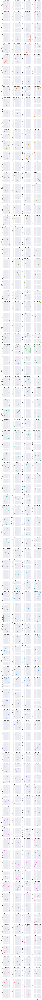

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Instead of using 'seaborn' directly, use seaborn's set_theme() to apply its styles
sns.set_theme()

# The rest of your code remains the same
g = sns.FacetGrid(dataset, col="village", hue="village",
                  sharey=False, col_wrap=4)
g = g.map(plt.plot, "Year", "NO3")
g.set_xticklabels(rotation=90)
plt.show()

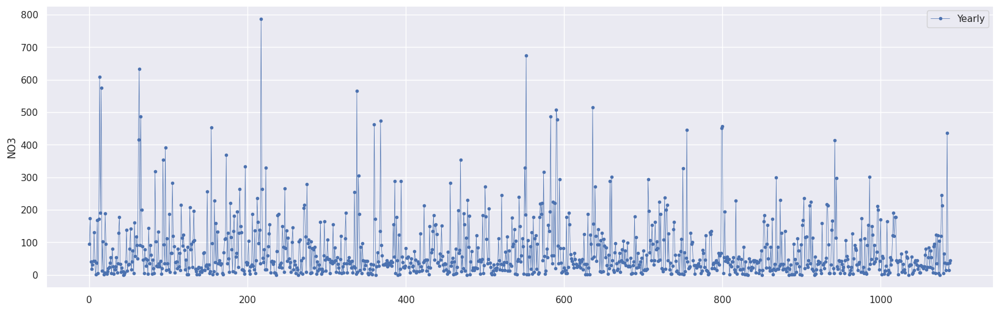

In [ ]:
import matplotlib.pyplot as plt
y = dataset['NO3']
fig, ax = plt.subplots(figsize=(20, 6))
ax.plot(y,marker='.', linestyle='-', linewidth=0.5, label='Yearly')
ax.set_ylabel('NO3')
ax.legend();

In [ ]:
from scipy import cluster
from scipy.stats.stats import pearsonr

<ipython-input-50-65b27e2a5c4a>:2: DeprecationWarning:

Please import `pearsonr` from the `scipy.stats` namespace; the `scipy.stats.stats` namespace is deprecated and will be removed in SciPy 2.0.0.



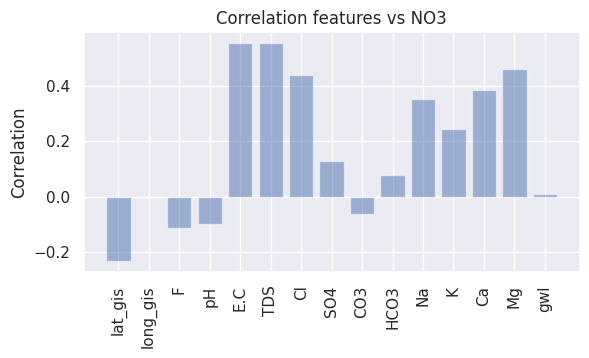


Correlation between features and NO#:
	lat_gis                                ==> -0.234026
	long_gis                               ==> -0.000228
	F                                      ==> -0.113949
	pH                                     ==> -0.100954
	E.C                                    ==> 0.553817
	TDS                                    ==> 0.554374
	Cl                                     ==> 0.439905
	SO4                                    ==> 0.129925
	CO3                                    ==> -0.063513
	HCO3                                   ==> 0.079219
	Na                                     ==> 0.352858
	K                                      ==> 0.243686
	Ca                                     ==> 0.384150
	Mg                                     ==> 0.460049
	gwl                                    ==> 0.009148


In [ ]:
### Correlation between features and NO3

features_names = ('lat_gis', 'long_gis', 'F', 'pH', 'E.C',
                  'TDS', 'Cl', 'SO4',
                  'CO3', 'HCO3', 'Na',
                  'K', 'Ca',
                  'Mg', 'gwl',)

corr = []
for elm in features_names:
    corr.append(pearsonr(dataset[elm], dataset['NO3'])[0])

y_pos = np.arange(len(features_names))
plt.bar(y_pos, corr, align='center', alpha=0.5)
plt.xticks(y_pos, features_names, rotation='vertical')
plt.ylabel('Correlation')
plt.title('Correlation features vs NO3')
plt.subplots_adjust(top=0.95, bottom=0.45)
plt.show()

print("\nCorrelation between features and NO#:")
for i in range(0, len(features_names)):
    print("\t{0:38s} ==> {1:8f}".format(features_names[i], corr[i]))

Dataset Shape: (1089, 28)
Missing Values:
 Unnamed: 0           0
sno                  0
district             0
mandal               0
village              0
temp_id              0
long_gis             0
lat_gis              0
gwl                 27
Year                 0
pH                   0
E.C                  0
TDS                  0
CO3                  0
HCO3                 0
Cl                   0
F                    0
NO3                  0
SO4                  0
Na                   0
K                    0
Ca                   0
Mg                   0
T.H                  0
SAR                  0
Classification       0
RSC  meq  / L        0
Classification.1     0
dtype: int64
Data Types:
 Unnamed: 0            int64
sno                   int64
district             object
mandal               object
village              object
temp_id               int64
long_gis            float64
lat_gis             float64
gwl                 float64
Year                  int64
pH     

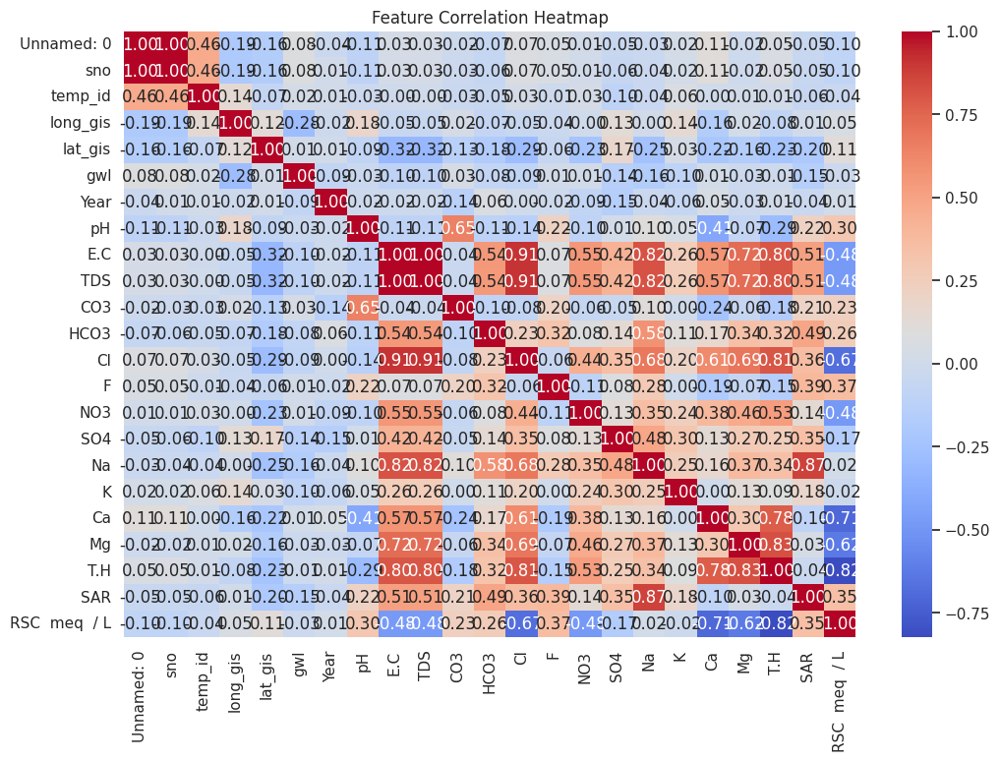

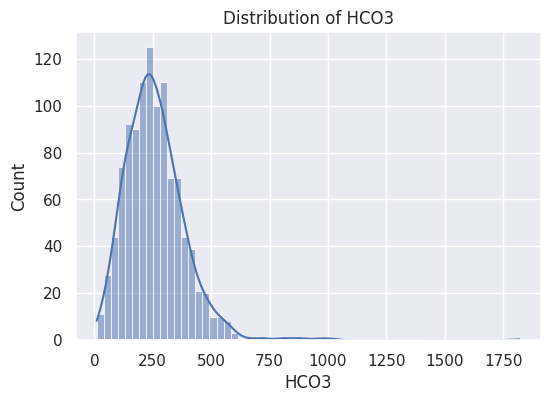

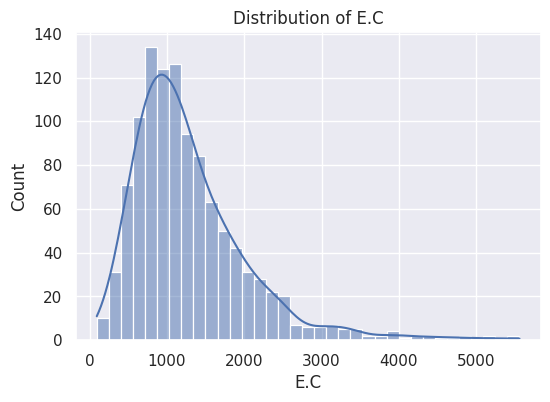

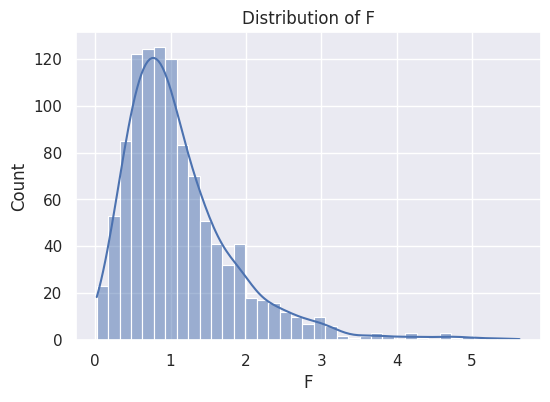

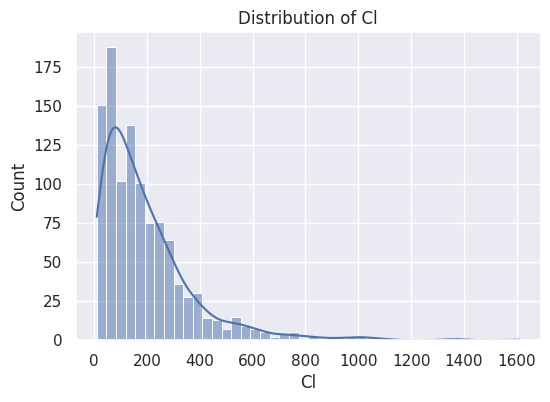

...

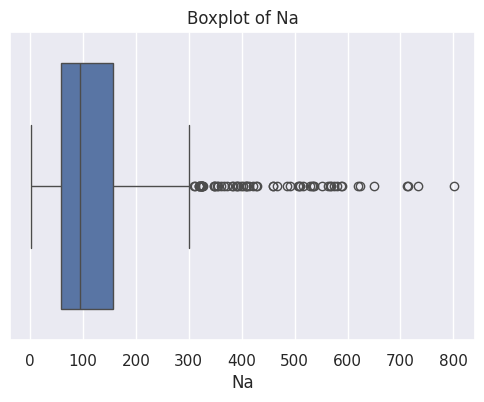

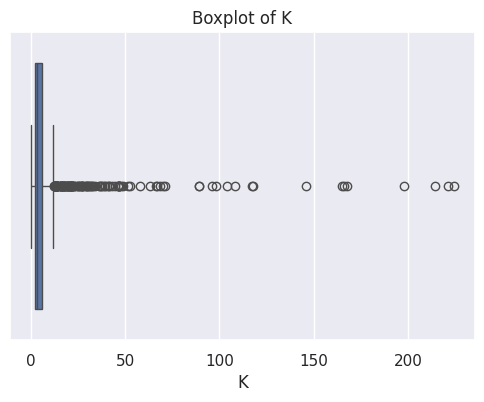

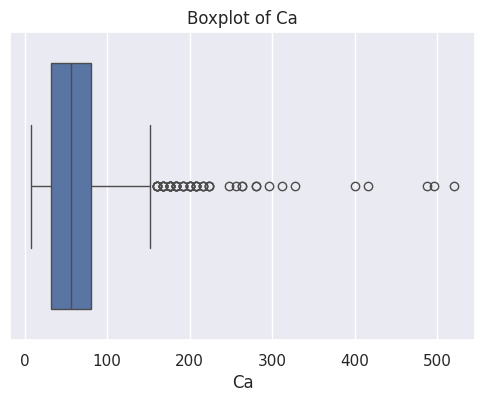

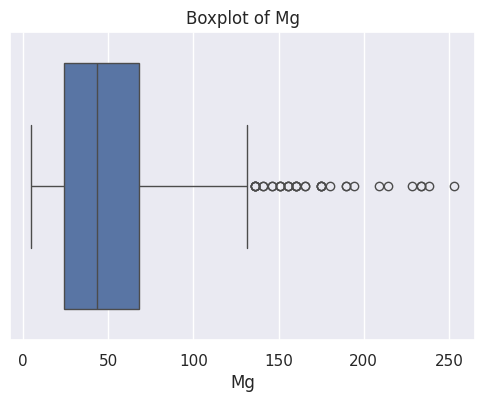

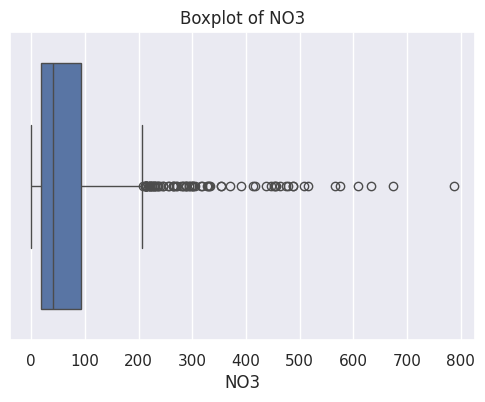

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
df = pd.read_csv('Copy of water_data.csv')

# Selecting features and target
X = df[['HCO3', 'E.C', 'F', 'Cl', 'SO4', 'Na', 'K', 'Ca', 'Mg']]
y = df['NO3']

# 1. Basic Information
print("Dataset Shape:", df.shape)
print("Missing Values:\n", df.isnull().sum())
print("Data Types:\n", df.dtypes)

# 2. Descriptive Statistics
print("Descriptive Statistics:\n", df.describe())

# 3. Correlation Heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(df.select_dtypes(include=np.number).corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Feature Correlation Heatmap')
plt.show()

# 4. Distribution Plots
features = ['HCO3', 'E.C', 'F', 'Cl', 'SO4', 'Na', 'K', 'Ca', 'Mg', 'NO3']
for feature in features:
    plt.figure(figsize=(6, 4))
    sns.histplot(df[feature], kde=True)
    plt.title(f'Distribution of {feature}')
    plt.show()

# 5. Pairplot
sns.pairplot(df)
plt.suptitle('Pairplot of Features and Target', y=1.02)
plt.show()

# 6. Boxplots for Outliers
for feature in features:
    plt.figure(figsize=(6, 4))
    sns.boxplot(x=df[feature])
    plt.title(f'Boxplot of {feature}')
    plt.show()

# Initial Observations (add more after analyzing the plots)
# - Check high correlations with NO3
# - Spot outliers in boxplots
# - Notice skewness in distribution plots
